In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [11]:
articles = pd.read_csv('./articles.csv')
customers = pd.read_csv('./customers.csv')
transactions = pd.read_csv('./transactions.csv')

In [107]:
article_names = list(articles["prod_name"])

## Merge all CSVs

In [4]:
merged_chisquared = pd.merge(transactions,articles,on='article_id')
merged_chisquared = pd.merge(merged_chisquared,customers,on='customer_id')
merged_chisquared

,Unnamed: 0,t_dat,customer_id,article_id,price,sales_channel_id,product_code,prod_name,product_type_no,product_type_name,...,section_name,garment_group_no,garment_group_name,detail_desc,FN,Active,club_member_status,fashion_news_frequency,age,postal_code
0,20820952,2020-01-02,00025f8226be50dcab09402a2cacd520a99e112fe01fdd...,797565002,0.030492,2,797565,Cactus wirless balboa,306,Bra,...,Womens Lingerie,1017,"Under-, Nightwear","Soft, non-wired lace bra with padded cups for ...",1.0,1.0,ACTIVE,Regularly,25.0,a04505cd362b8b1e3f1d8d47d8b31163eae82f078182a1...
1,20820953,2020-01-02,00025f8226be50dcab09402a2cacd520a99e112fe01fdd...,797565001,0.030492,2,797565,Cactus wirless balboa,306,Bra,...,Womens Lingerie,1017,"Under-, Nightwear","Soft, non-wired lace bra with padded cups for ...",1.0,1.0,ACTIVE,Regularly,25.0,a04505cd362b8b1e3f1d8d47d8b31163eae82f078182a1...
2,30333506,2020-08-14,00025f8226be50dcab09402a2cacd520a99e112fe01fdd...,751471001,0.033881,2,751471,Pluto RW slacks (1),272,Trousers,...,Womens Everyday Collection,1009,Trousers,Ankle-length cigarette trousers in a stretch w...,1.0,1.0,ACTIVE,Regularly,25.0,a04505cd362b8b1e3f1d8d47d8b31163eae82f078182a1...
3,30333505,2020-08-14,00025f8226be50dcab09402a2cacd520a99e112fe01fdd...,781613006,0.050831,2,781613,Jennifer,264,Blazer,...,Womens Everyday Collection,1008,Dressed,"Long jacket in a soft weave with notch lapels,...",1.0,1.0,ACTIVE,Regularly,25.0,a04505cd362b8b1e3f1d8d47d8b31163eae82f078182a1...
4,24985087,2020-04-24,00025f8226be50dcab09402a2cacd520a99e112fe01fdd...,855823003,0.025407,2,855823,Swift midi bodycon,265,Dress,...,Divided Collection,1013,Dresses Ladies,"Sleeveless, fitted, knee-length dress in jerse...",1.0,1.0,ACTIVE,Regularly,25.0,a04505cd362b8b1e3f1d8d47d8b31163eae82f078182a1...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10967367,31757758,2020-09-22,10d455608b1d73268f0a9ff1a392ccd681e665ed471f6d...,932182001,0.033881,2,932182,Britney Body,256,Bodysuit,...,Womens Everyday Collection,1005,Jersey Fancy,Long-sleeved body in ribbed jersey with a turt...,NaN,NaN,ACTIVE,NONE,26.0,1c7433290a877270ceeb79307ecfb956f6a2fac597cad3...
10967368,31779377,2020-09-22,b834a2cb440d2298493d254196abb73e101d8b35b155c6...,870982002,0.061000,2,870982,Tina fur,261,Outdoor Waistcoat,...,Divided Collection,1007,Outdoor,Jacket in soft faux fur with large notch lapel...,1.0,1.0,ACTIVE,Regularly,62.0,f69e5a3e69986eeaf2bc9fa7b8f80ef41025effb319af9...
10967369,31772356,2020-09-22,83b8a97fd3decf8e21d05a9acaea822eaa569c957ea232...,893427001,0.084729,2,893427,Iron PU jumpsuit,267,Jumpsuit/Playsuit,...,Womens Everyday Collection,1009,Trousers,Calf-length jumpsuit in imitation leather with...,NaN,NaN,ACTIVE,NONE,22.0,5baebd8b6bc21037b12bdb12806555968b798c0581e538...
10967370,31772357,2020-09-22,83b8a97fd3decf8e21d05a9acaea822eaa569c957ea232...,893427001,0.084729,2,893427,Iron PU jumpsuit,267,Jumpsuit/Playsuit,...,Womens Everyday Collection,1009,Trousers,Calf-length jumpsuit in imitation leather with...,NaN,NaN,ACTIVE,NONE,22.0,5baebd8b6bc21037b12bdb12806555968b798c0581e538...


# Feature Importance - extracting relevant attributes

Customer age, product_type_name, product_group_name, graphical_appearance_name, colour_group_name, perceived_colour_value_name, perceived_colour_master_name, department_name, index_name, index_group_name, garment_group_name **for all historical transactions**

In [4]:
merged_chisquared_values = merged_chisquared[['product_type_name','product_group_name','graphical_appearance_name','colour_group_name','perceived_colour_value_name','perceived_colour_master_name','department_name','index_name','index_group_name','garment_group_name','age']]
merged_chisquared_values

,product_type_name,product_group_name,graphical_appearance_name,colour_group_name,perceived_colour_value_name,perceived_colour_master_name,department_name,index_name,index_group_name,garment_group_name,age
0,Bra,Underwear,Solid,Red,Medium,Red,Expressive Lingerie,Lingeries/Tights,Ladieswear,"Under-, Nightwear",25.0
1,Bra,Underwear,Solid,Black,Dark,Black,Expressive Lingerie,Lingeries/Tights,Ladieswear,"Under-, Nightwear",25.0
2,Trousers,Garment Lower body,Solid,Black,Dark,Black,Trouser,Ladieswear,Ladieswear,Trousers,25.0
3,Blazer,Garment Upper body,Solid,Black,Dark,Black,Suit jacket,Ladieswear,Ladieswear,Dressed,25.0
4,Dress,Garment Full body,Solid,Black,Dark,Black,Dresses,Divided,Divided,Dresses Ladies,25.0
...,...,...,...,...,...,...,...,...,...,...,...
10967367,Bodysuit,Garment Upper body,Solid,Black,Dark,Black,Jersey fancy,Ladieswear,Ladieswear,Jersey Fancy,26.0
10967368,Outdoor Waistcoat,Garment Upper body,Solid,Light Beige,Dusty Light,Beige,Outdoor/Blazers,Divided,Divided,Outdoor,62.0
10967369,Jumpsuit/Playsuit,Garment Full body,Treatment,Black,Dark,Black,Trouser,Ladieswear,Ladieswear,Trousers,22.0
10967370,Jumpsuit/Playsuit,Garment Full body,Treatment,Black,Dark,Black,Trouser,Ladieswear,Ladieswear,Trousers,22.0


In [5]:
# filter transactions by customer age
def load_dataset_age(start_age, end_age):
    age = [x for x in range (start_age,end_age+1)]
    merged_chisquared_values_age = merged_chisquared_values[merged_chisquared_values['age'].isin(age)]
    return merged_chisquared_values_age

In [8]:
#customers between ages 21-30
test_dataset = load_dataset_age(21,30)
test_dataset

,product_type_name,product_group_name,graphical_appearance_name,colour_group_name,perceived_colour_value_name,perceived_colour_master_name,department_name,index_name,index_group_name,garment_group_name,age
0,Bra,Underwear,Solid,Red,Medium,Red,Expressive Lingerie,Lingeries/Tights,Ladieswear,"Under-, Nightwear",25.0
1,Bra,Underwear,Solid,Black,Dark,Black,Expressive Lingerie,Lingeries/Tights,Ladieswear,"Under-, Nightwear",25.0
2,Trousers,Garment Lower body,Solid,Black,Dark,Black,Trouser,Ladieswear,Ladieswear,Trousers,25.0
3,Blazer,Garment Upper body,Solid,Black,Dark,Black,Suit jacket,Ladieswear,Ladieswear,Dressed,25.0
4,Dress,Garment Full body,Solid,Black,Dark,Black,Dresses,Divided,Divided,Dresses Ladies,25.0
...,...,...,...,...,...,...,...,...,...,...,...
10967366,Bodysuit,Garment Upper body,Solid,Black,Dark,Black,Jersey fancy,Ladieswear,Ladieswear,Jersey Fancy,26.0
10967367,Bodysuit,Garment Upper body,Solid,Black,Dark,Black,Jersey fancy,Ladieswear,Ladieswear,Jersey Fancy,26.0
10967369,Jumpsuit/Playsuit,Garment Full body,Treatment,Black,Dark,Black,Trouser,Ladieswear,Ladieswear,Trousers,22.0
10967370,Jumpsuit/Playsuit,Garment Full body,Treatment,Black,Dark,Black,Trouser,Ladieswear,Ladieswear,Trousers,22.0


## Chi Squared feature selection on article attributes

Feature 0 graphical_appearance_name: 1619256.946592
Feature 1 colour_group_name: 4874844.730943
Feature 2 perceived_colour_value_name: 131647.968420
Feature 3 perceived_colour_master_name: 1953141.153380
Feature 4 index_name: 418682.427195


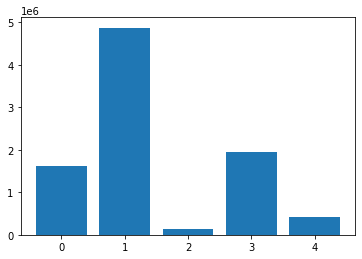

In [13]:
# chi squared feature selection for categorical data
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OrdinalEncoder
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from matplotlib import pyplot

attributes = ['product_type_name','graphical_appearance_name', 'colour_group_name', 'perceived_colour_value_name', 'perceived_colour_master_name','index_name']
# load the dataset
def load_dataset(articles):
    article_attr = articles[attributes]
    dataset = article_attr.values
    X = dataset[:, 1:]
    y = dataset[:,0]
    # format all fields as string
    X = X.astype(str)
    return X, y

# prepare input data
def prepare_inputs(X_train, X_test):
    oe = OrdinalEncoder()
    oe.fit(X_train)
    X_train_enc = oe.transform(X_train)
    X_test_enc = oe.transform(X_test)
    return X_train_enc, X_test_enc

# prepare target
def prepare_targets(y_train, y_test):
    le = LabelEncoder()
    le.fit(y_train)
    y_train_enc = le.transform(y_train)
    y_test_enc = le.transform(y_test)
    return y_train_enc, y_test_enc

# feature selection
def select_features(X_train, y_train, X_test):
    fs = SelectKBest(score_func=chi2, k='all')
    fs.fit(X_train, y_train)
    X_train_fs = fs.transform(X_train)
    X_test_fs = fs.transform(X_test)
    return X_train_fs, X_test_fs, fs

# load the dataset HERE
X, y = load_dataset(test_dataset)
# split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=1)
# prepare input data
X_train_enc, X_test_enc = prepare_inputs(X_train, X_test)
# prepare output data
y_train_enc, y_test_enc = prepare_targets(y_train, y_test)
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train_enc, y_train_enc, X_test_enc)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d %s: %f' % (i, attributes[i+1], fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

## Mutual Information Feature Selection on article attributes

Feature 0: 0.378622
Feature 1: 0.321259
Feature 2: 0.122302
Feature 3: 0.259857
Feature 4: 0.832939


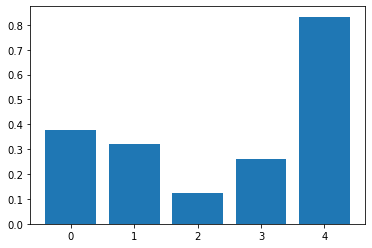

In [14]:
# example of mutual information feature selection for categorical data
from sklearn.feature_selection import mutual_info_classif

# load the dataset
def load_dataset(articles):
    article_attr = articles[attributes]
    dataset = article_attr.values
    X = dataset[:, 1:]
    y = dataset[:,0]
    # format all fields as string
    X = X.astype(str)
    return X, y

# prepare input data
def prepare_inputs(X_train, X_test):
	oe = OrdinalEncoder()
	oe.fit(X_train)
	X_train_enc = oe.transform(X_train)
	X_test_enc = oe.transform(X_test)
	return X_train_enc, X_test_enc

# prepare target
def prepare_targets(y_train, y_test):
	le = LabelEncoder()
	le.fit(y_train)
	y_train_enc = le.transform(y_train)
	y_test_enc = le.transform(y_test)
	return y_train_enc, y_test_enc

# feature selection
def select_features(X_train, y_train, X_test):
	fs = SelectKBest(score_func=mutual_info_classif, k='all')
	fs.fit(X_train, y_train)
	X_train_fs = fs.transform(X_train)
	X_test_fs = fs.transform(X_test)
	return X_train_fs, X_test_fs, fs

# # load the dataset
# X, y = load_dataset(test_dataset)
# # split into train and test sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=1)
# prepare input data
X_train_enc, X_test_enc = prepare_inputs(X_train, X_test)
# prepare output data
y_train_enc, y_test_enc = prepare_targets(y_train, y_test)
# feature selection
X_train_fs, X_test_fs, fs = select_features(X_train_enc, y_train_enc, X_test_enc)
# what are scores for the features
for i in range(len(fs.scores_)):
	print('Feature %d: %f' % (i, fs.scores_[i]))
# plot the scores
pyplot.bar([i for i in range(len(fs.scores_))], fs.scores_)
pyplot.show()

# Image Feature extraction using ResNet50

A 50 layer deep convoluted network pre-trained on more than a million images from the ImageNet database helped us to label each article image (from the H&M database) with its feature values (feature map).

In [12]:
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.layers import Dropout, Flatten, Dense
from keras import applications
from sklearn.metrics import pairwise_distances
import requests
from PIL import Image
import pickle
from datetime import datetime
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True
import plotly.figure_factory as ff
import plotly.graph_objects as go
import plotly.express as px
#import streamlit as st
#use the below library while displaying the images in jupyter notebook
from IPython.display import display, Image

## First 50k images

In [ ]:
from tensorflow.keras.applications.resnet50 import ResNet50

img_width, img_height = 224, 224

#top_model_weights_path = 'resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5'
train_data_dir = "/Users/danielyang/Downloads/h-and-m-personalized-fashion-recommendations/images"

nb_train_samples = 50000
epochs = 50
batch_size = 1

def extract_features():
    Itemcodes = []
    datagen = ImageDataGenerator(rescale=1. / 255)
    model = ResNet50(include_top=False, weights='imagenet')
    #pass in data from directory
    generator = datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode=None,
        shuffle=False)
    for i in generator.filenames:
        Itemcodes.append(i[(i.find("/")+1):i.find(".")])
    #predict features
    extracted_features = model.predict_generator(generator, nb_train_samples // batch_size)
    extracted_features = extracted_features.reshape((50000, 100352))
    
    np.save(open('./hm_50k.npy', 'wb'), extracted_features)
    np.save(open('./hm_product_ids_50k.npy', 'wb'), np.array(Itemcodes))
    
a = datetime.now()
extract_features()
print("Time taken in feature extraction", datetime.now()-a)
extract_features()

## Next 57k images

In [ ]:
img_width, img_height = 224, 224

#top_model_weights_path = 'resnet50_weights_tf_dim_ordering_tf_kernels_notop.h5'
train_data_dir = "/Users/danielyang/Downloads/h-and-m-personalized-fashion-recommendations/images2"

# enter sample number
nb_train_samples = 57750
epochs = 50
batch_size = 1

def extract_features():
    Itemcodes = []
    datagen = ImageDataGenerator(rescale=1. / 255)
    model = ResNet50(include_top=False, weights='imagenet')
    generator = datagen.flow_from_directory(
        train_data_dir,
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode=None,
        shuffle=False)
    for i in generator.filenames:
        Itemcodes.append(i[(i.find("/")+1):i.find(".")])
    extracted_features = model.predict_generator(generator, nb_train_samples // batch_size)
    extracted_features = extracted_features.reshape((57750, 100352))

    np.save(open('./57k_features_2.npy', 'wb'), extracted_features)
    np.save(open('./57k_ids_2.npy', 'wb'), np.array(Itemcodes))
    
a = datetime.now()
extract_features()

In [6]:
# make a copy of the articles dataframe
# articles = pd.read_csv('./articles.csv')
a_copy = articles.copy()
df_Productids = list(a_copy['article_id'])

## 1st 50K articles

In [3]:
# make sure correct feature map is used
extracted_features = np.load('/Users/danielyang/Desktop/DSAI Lab/hm_50k.npy')
Productids1 = np.load('/Users/danielyang/Desktop/DSAI Lab/hm_product_ids_50k.npy')
Productids1 = list(Productids1)
Productids1

['0108775015',
 '0108775044',
 '0108775051',
 '0110065001',
 '0110065002',
 '0110065011',
 '0111565001',
 '0111565003',
 '0111586001',
 '0111593001',
 '0111609001',
 '0112679048',
 '0112679052',
 '0114428026',
 '0114428030',
 '0116379047',
 '0118458003',
 '0118458004',
 '0118458028',
 '0118458029',
 '0118458034',
 '0118458038',
 '0118458039',
 '0120129001',
 '0120129014',
 '0120129018',
 '0120129025',
 '0123173001',
 '0126589006',
 '0126589007',
 '0126589010',
 '0126589011',
 '0126589012',
 '0129085001',
 '0129085026',
 '0129085027',
 '0130035001',
 '0141661022',
 '0141661025',
 '0144993001',
 '0145872001',
 '0145872037',
 '0145872043',
 '0145872051',
 '0145872052',
 '0145872053',
 '0146706001',
 '0146706004',
 '0146706005',
 '0146721001',
 '0146721002',
 '0146730001',
 '0147339034',
 '0148033001',
 '0148033006',
 '0150959011',
 '0150959013',
 '0153115019',
 '0153115020',
 '0153115021',
 '0153115039',
 '0153115040',
 '0153115043',
 '0156224001',
 '0156224002',
 '0156227001',
 '01562270

==================== input product image ====================


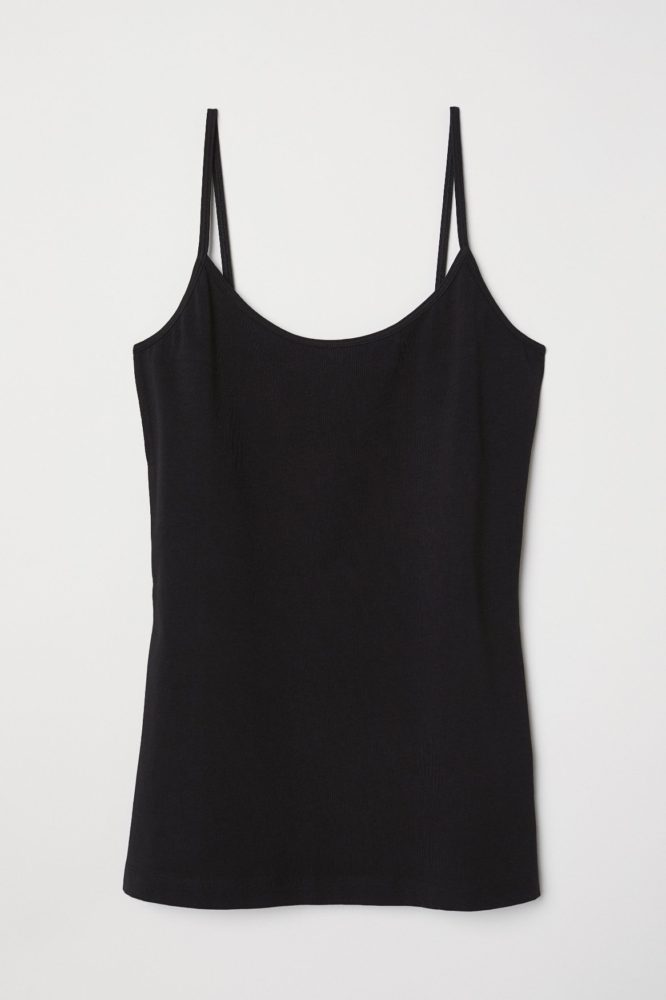

Product Title:  Strap top

 ==================== Recommended products ====================


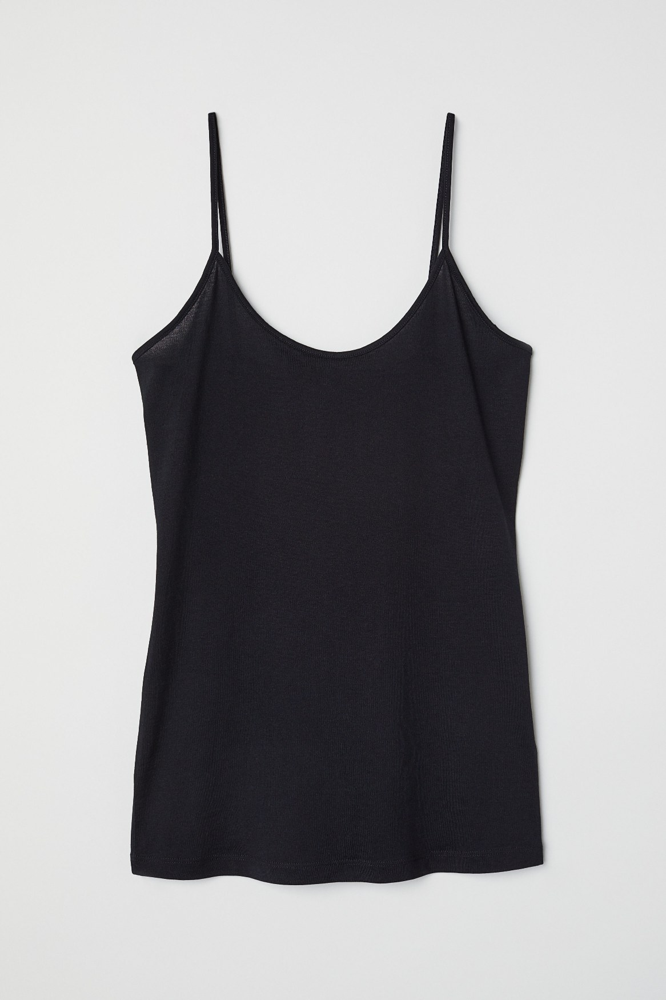

Product Title:  PE Emma Camisole top 2
Euclidean Distance from input image: 18.905054


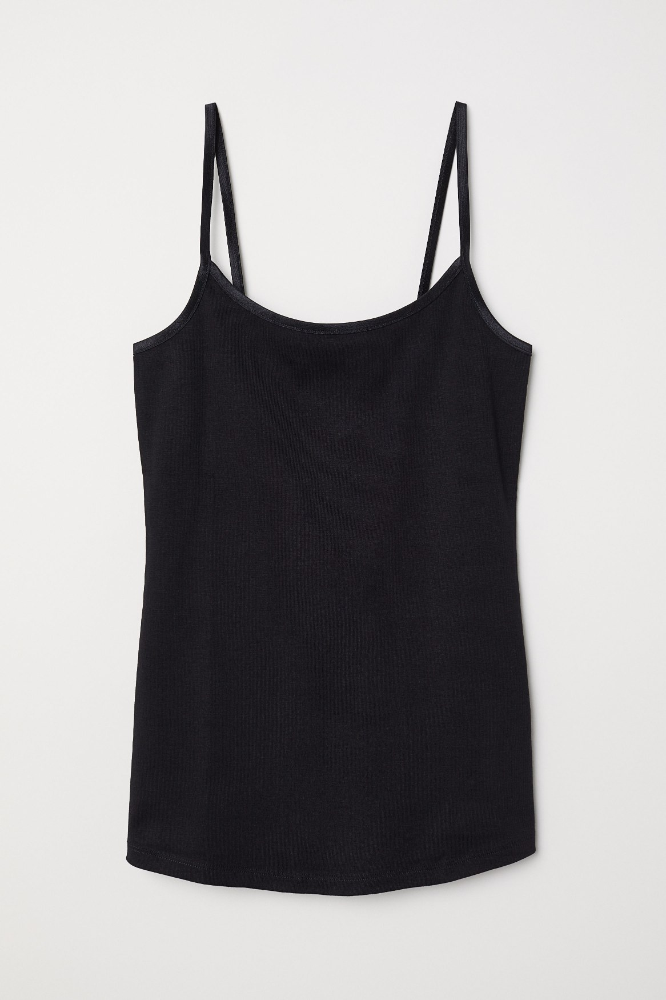

Product Title:  gaby
Euclidean Distance from input image: 20.300877


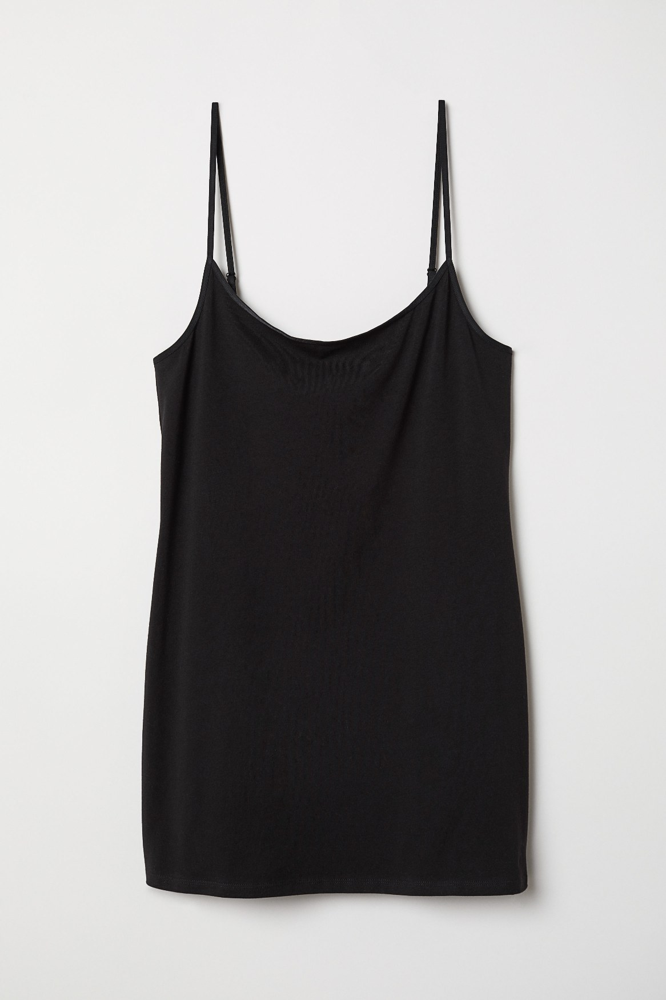

Product Title:  DIV Nicky long tank top
Euclidean Distance from input image: 23.675865


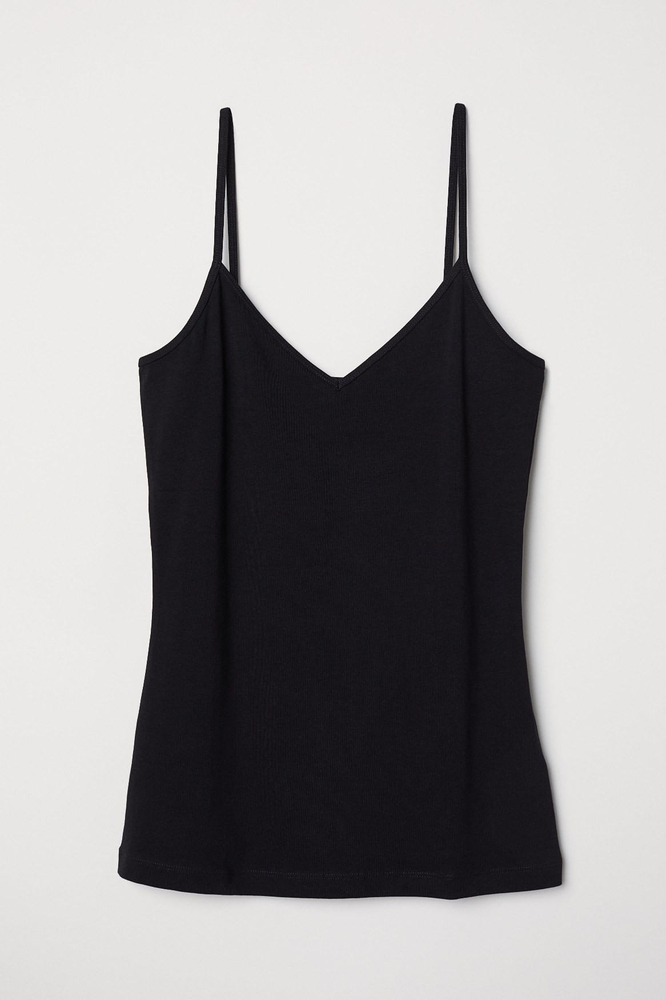

Product Title:  V-neck strap top
Euclidean Distance from input image: 26.318056


In [7]:
def get_similar_products_cnn1(product_id, num_results):
    doc_id = Productids1.index(product_id)
    pairwise_dist = pairwise_distances(extracted_features, extracted_features[doc_id].reshape(1,-1))
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]
    print("="*20, "input product image", "="*20)
    ip_row = a_copy[['article_id','prod_name']].loc[a_copy['article_id']==int(Productids1[indices[0]])]
#     print(ip_row.head())
    for indx, row in ip_row.iterrows():
        display(Image(filename = "/Users/danielyang/Downloads/h-and-m-personalized-fashion-recommendations/images/" + str(product_id)[0:3]+'/'+str(product_id)+'.jpg', width = 224, height = 224,embed=True))
        print('Product Title: ', row['prod_name'])
    print("\n","="*20, "Recommended products", "="*20)
    for i in range(1,len(indices)):
        rows = a_copy[['article_id','prod_name']].loc[a_copy['article_id']==int(Productids1[indices[i]])]
#         print(rows)
        for indx, row in rows.iterrows():
            display(Image(filename = "/Users/danielyang/Downloads/h-and-m-personalized-fashion-recommendations/images/" + '0' + str(row['article_id'])[0:2] +'/'+ "0" +str(row['article_id'])+'.jpg', width = 224, height = 224,embed=True))
            print('Product Title: ', row['prod_name'])
            print('Euclidean Distance from input image:', pdists[i])

get_similar_products_cnn1('0108775015', 5)

==================== input product image ====================


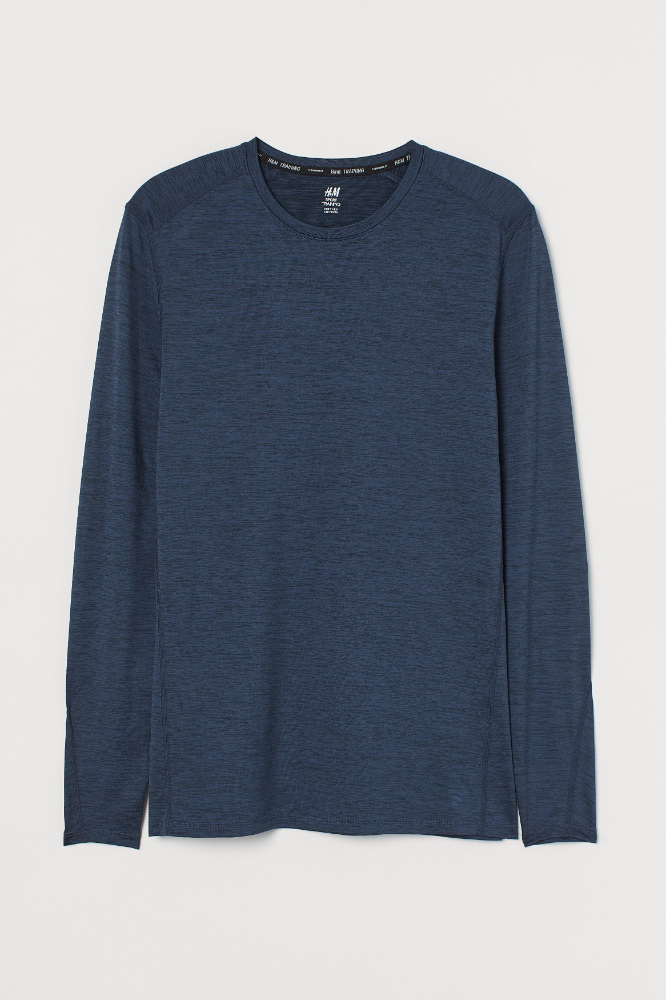

Product Title:  Dorian l/s basic

 ==================== Recommended products ====================


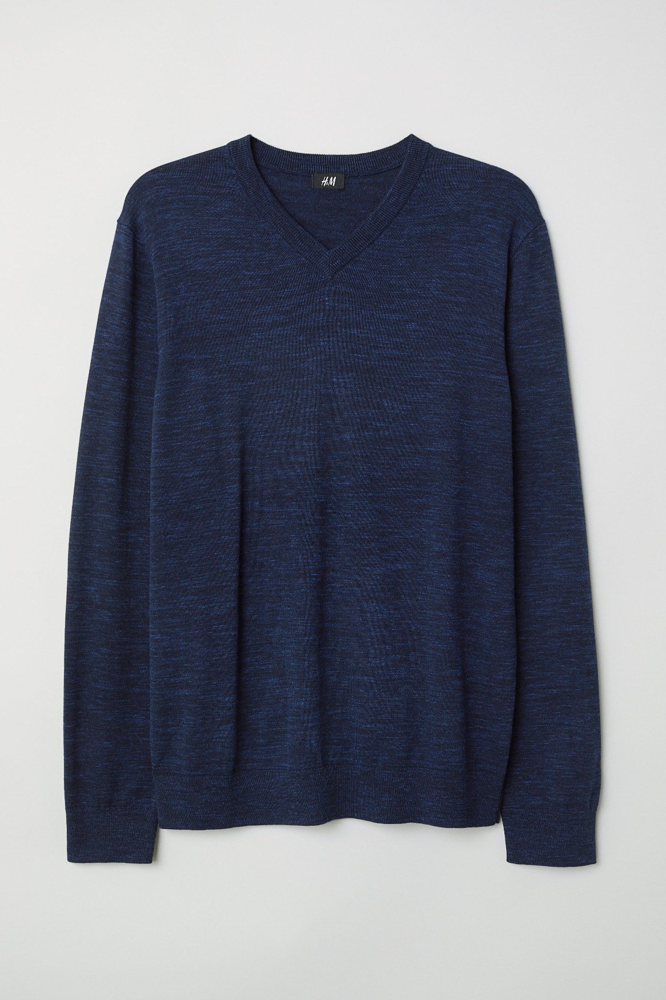

Product Title:  PAUL V-NECK
Euclidean Distance from input image: 11.273617


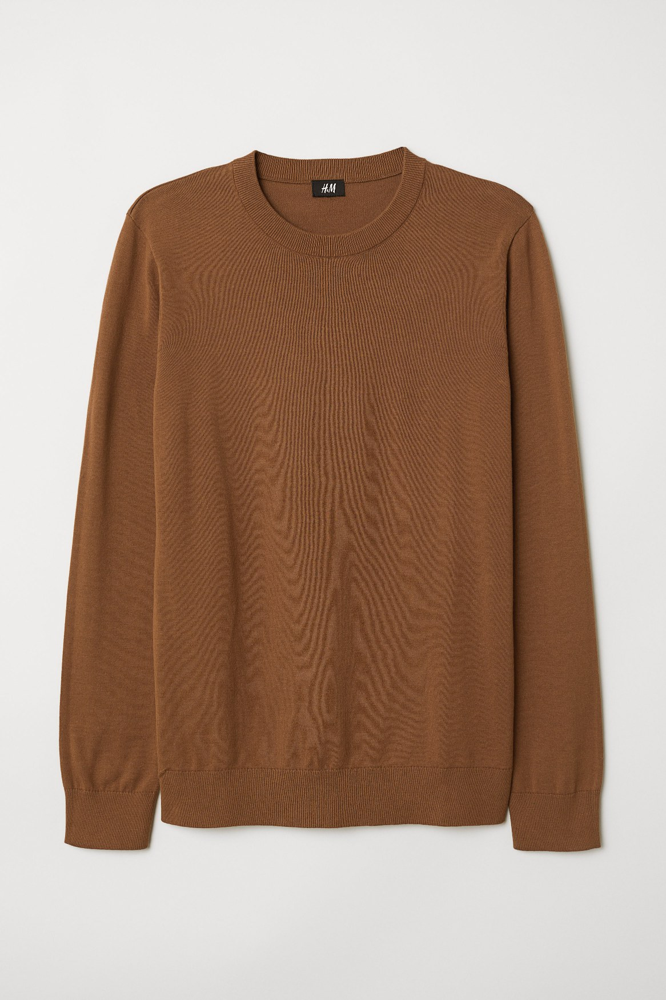

Product Title:  PAUL  R-NECK
Euclidean Distance from input image: 13.108181


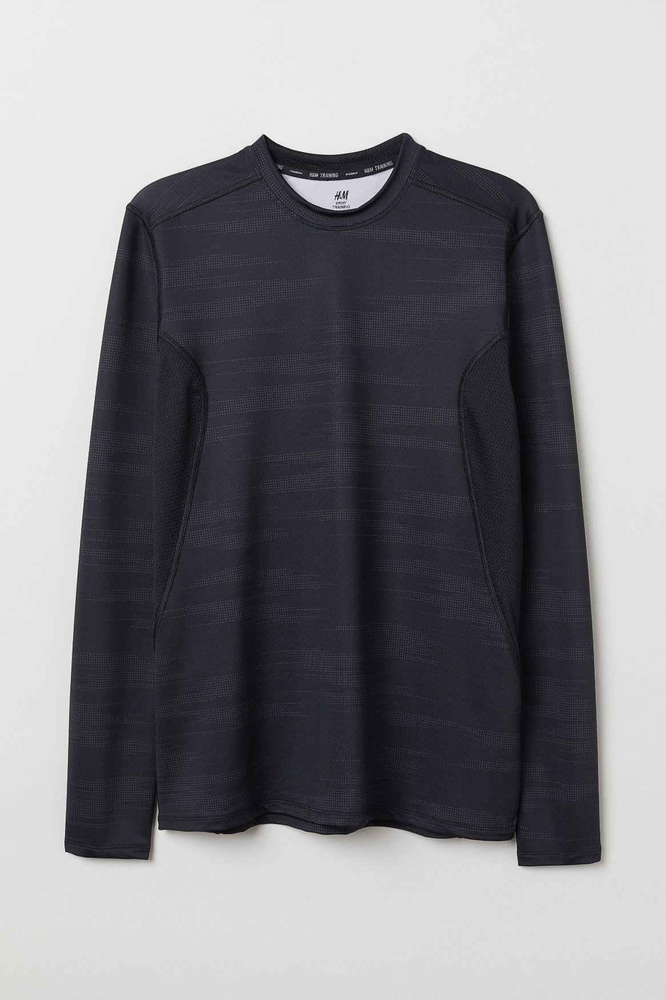

Product Title:  Furno Top
Euclidean Distance from input image: 13.376918


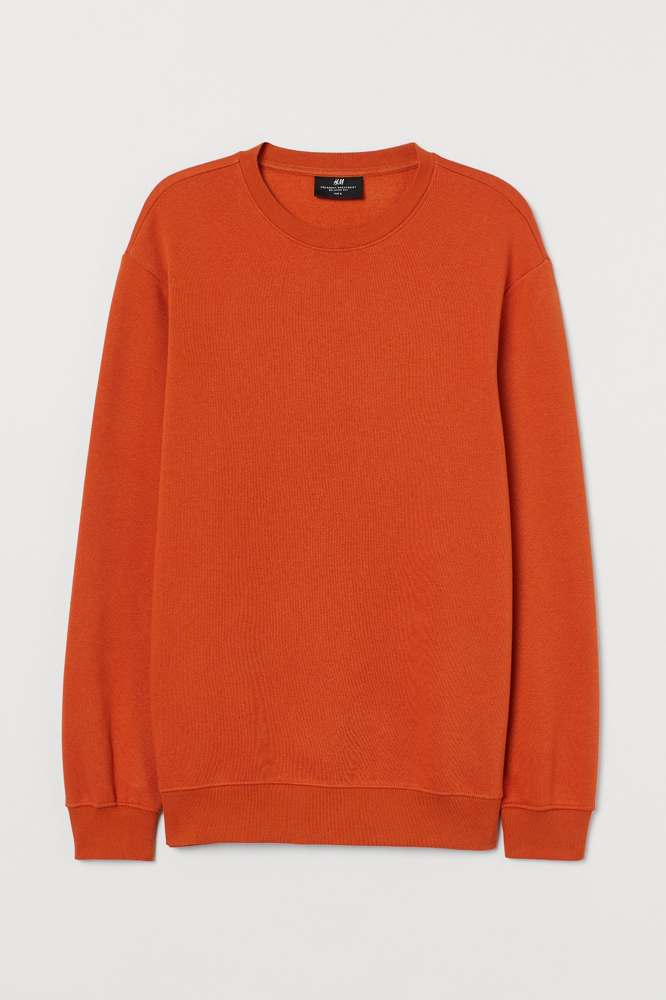

Product Title:  PETAR SWEATSHIRT
Euclidean Distance from input image: 13.795387


In [8]:
get_similar_products_cnn1('0145872052', 5)

==================== input product image ====================


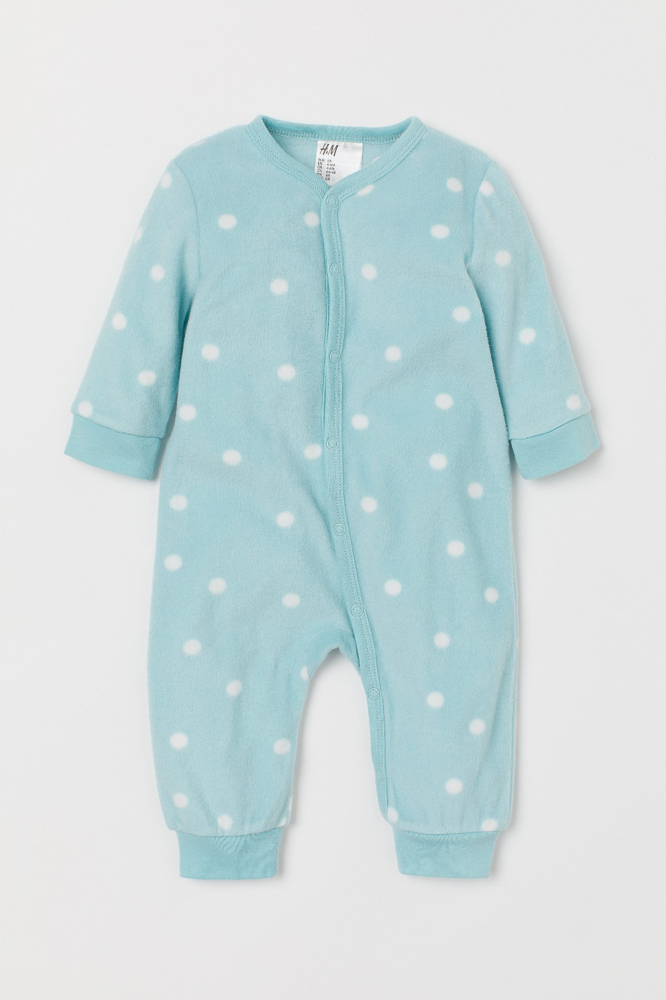

Product Title:  FLEECE PYJAMA

 ==================== Recommended products ====================


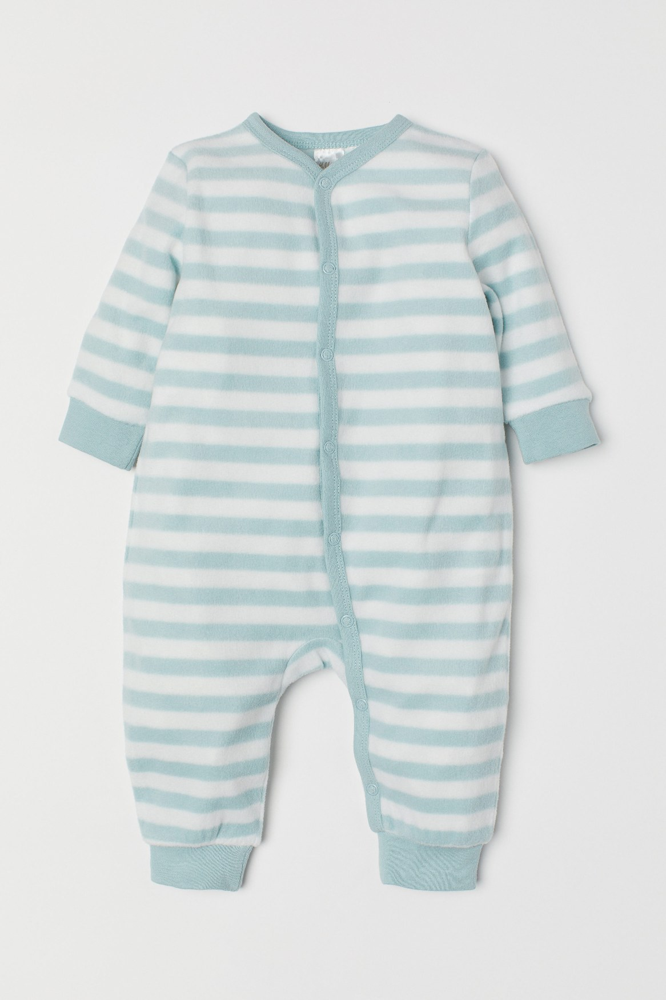

Product Title:  FLEECE PYJAMA
Euclidean Distance from input image: 4.558478


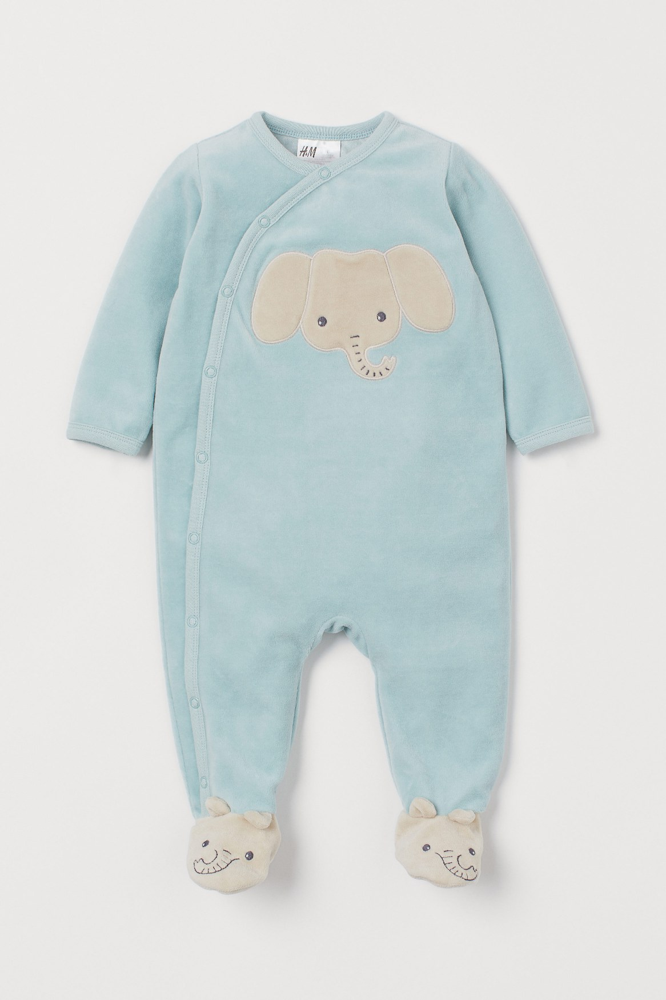

Product Title:  Velour PJ w feet TVP
Euclidean Distance from input image: 4.764682


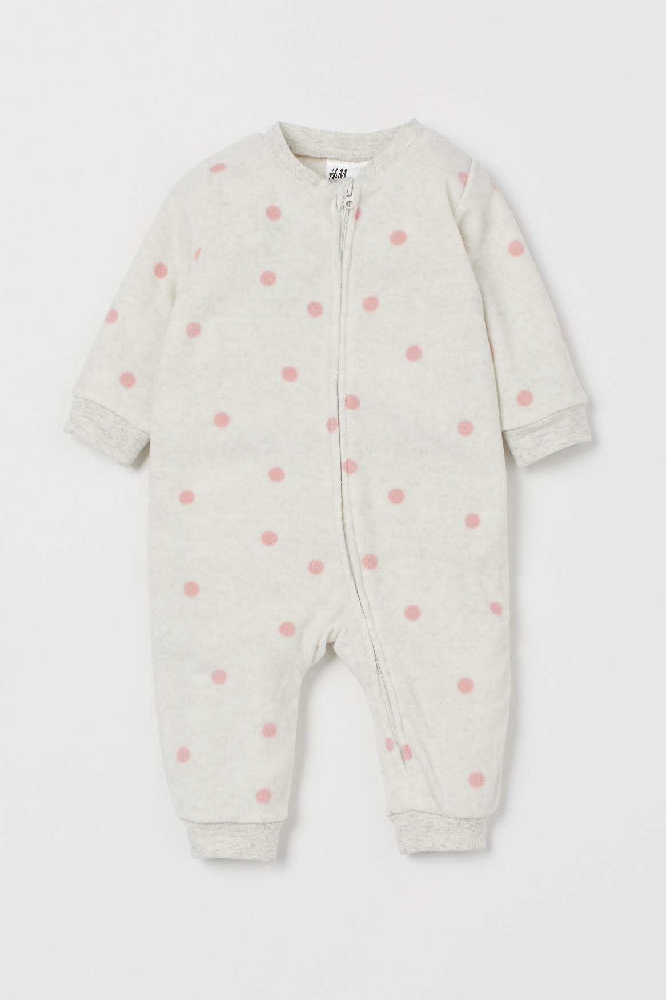

Product Title:  FLEECE PYJAMA
Euclidean Distance from input image: 4.922101


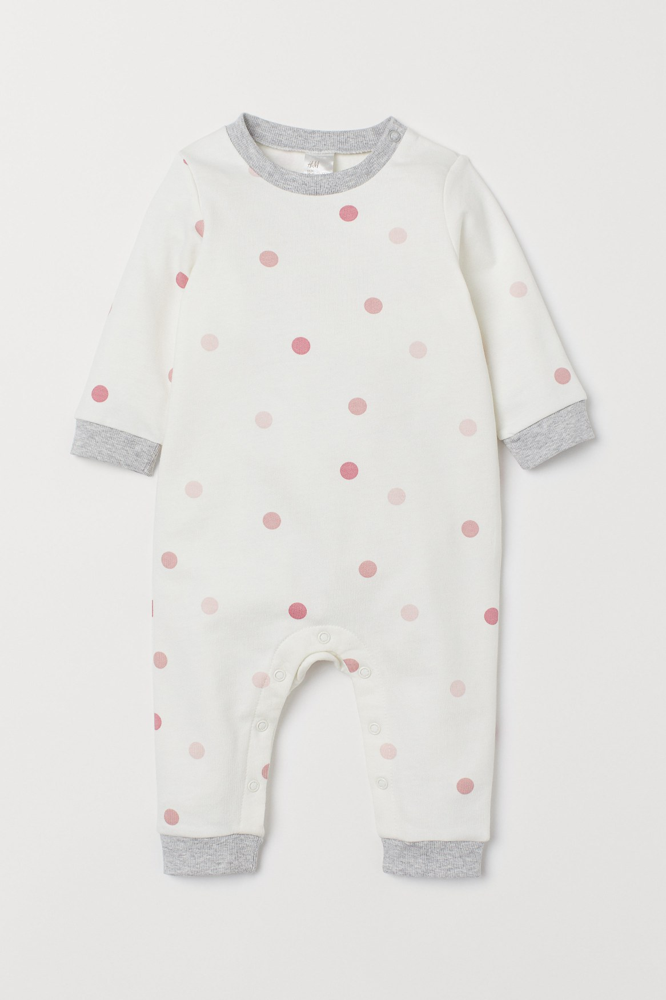

Product Title:  Sweatshirt Overall
Euclidean Distance from input image: 4.98278


In [9]:
get_similar_products_cnn1('0174057035', 5)

## Remaining 57K articles

In [21]:
extracted_features = np.load('/Users/danielyang/Desktop/DSAI Lab/57k_features_2.npy')
Productids2 = np.load('/Users/danielyang/Desktop/DSAI Lab/57k_ids_2.npy')
Productids2 = list(Productids2)
Productids2

['0690027001',
 '0690033001',
 '0690048001',
 '0690054001',
 '0690054002',
 '0690054004',
 '0690054006',
 '0690054007',
 '0690054009',
 '0690066001',
 '0690074001',
 '0690074002',
 '0690076001',
 '0690076002',
 '0690077001',
 '0690090001',
 '0690091002',
 '0690093001',
 '0690093002',
 '0690102005',
 '0690107001',
 '0690108001',
 '0690108003',
 '0690108004',
 '0690108005',
 '0690112002',
 '0690114001',
 '0690114002',
 '0690115001',
 '0690115002',
 '0690156001',
 '0690156002',
 '0690157002',
 '0690158001',
 '0690158002',
 '0690158003',
 '0690158007',
 '0690158008',
 '0690158011',
 '0690158012',
 '0690158013',
 '0690174001',
 '0690176001',
 '0690183001',
 '0690183003',
 '0690193001',
 '0690193002',
 '0690193003',
 '0690193005',
 '0690193007',
 '0690193008',
 '0690197001',
 '0690200001',
 '0690202001',
 '0690209002',
 '0690211001',
 '0690212001',
 '0690212002',
 '0690213001',
 '0690217001',
 '0690222001',
 '0690222002',
 '0690222003',
 '0690222004',
 '0690222005',
 '0690222006',
 '06902220

==================== input product image ====================


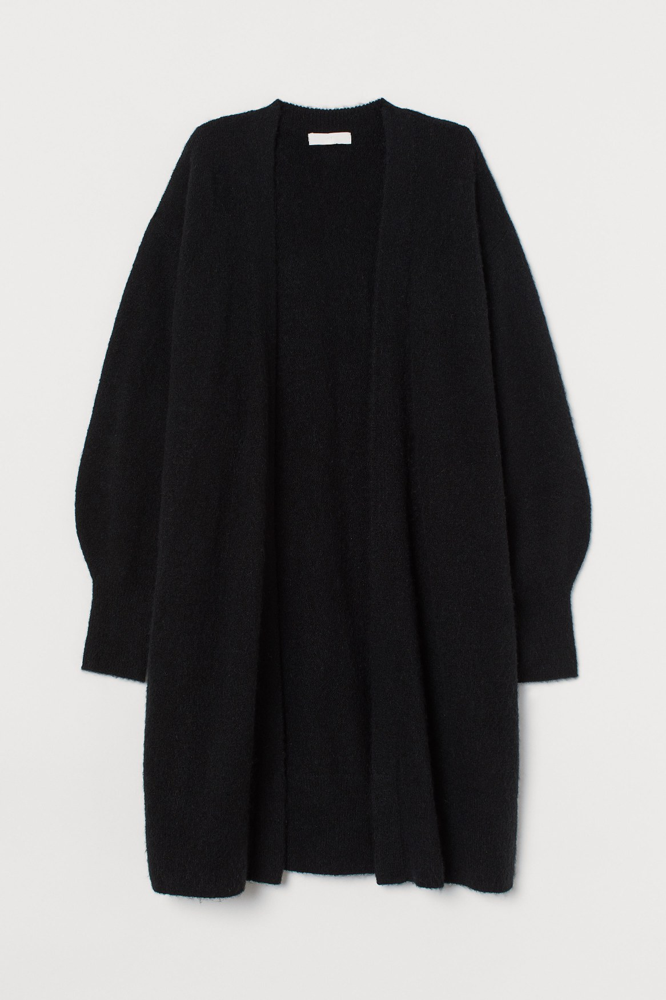

Product Title:  Baraboom throw-on

 ==================== Recommended products ====================


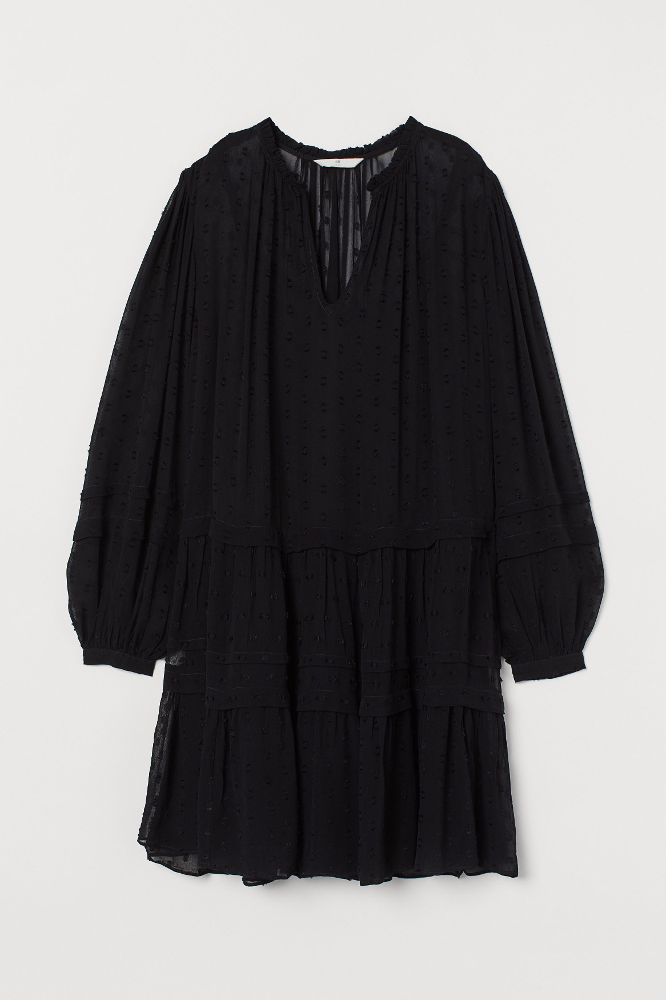

Product Title:  Vendela tunic
Euclidean Distance from input image: 22.944746


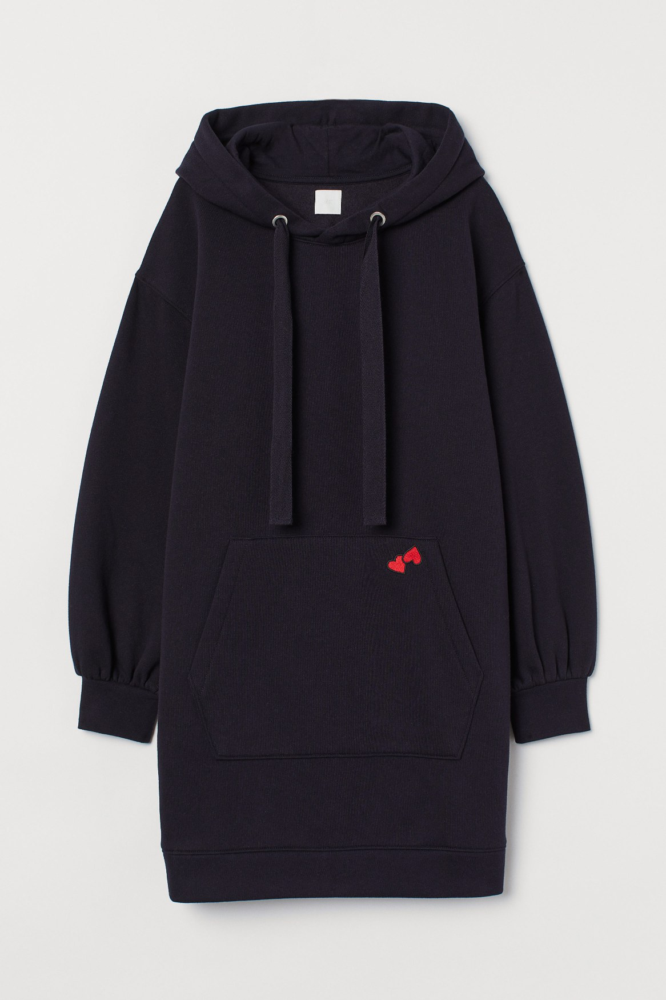

Product Title:  CNY Milkyway solid
Euclidean Distance from input image: 23.384897


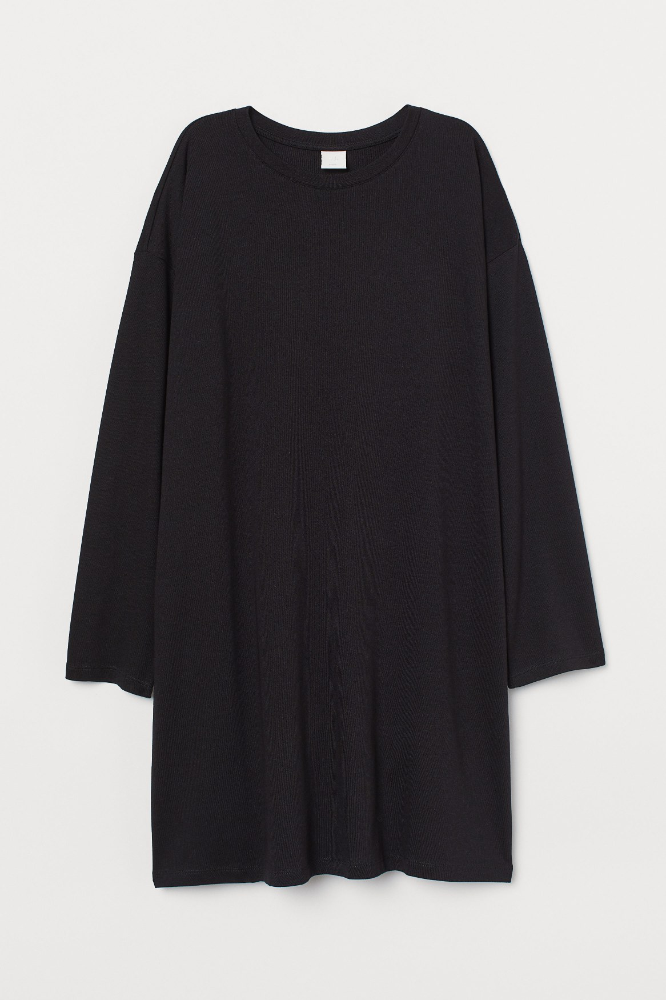

Product Title:  Shanghai dress
Euclidean Distance from input image: 23.738039


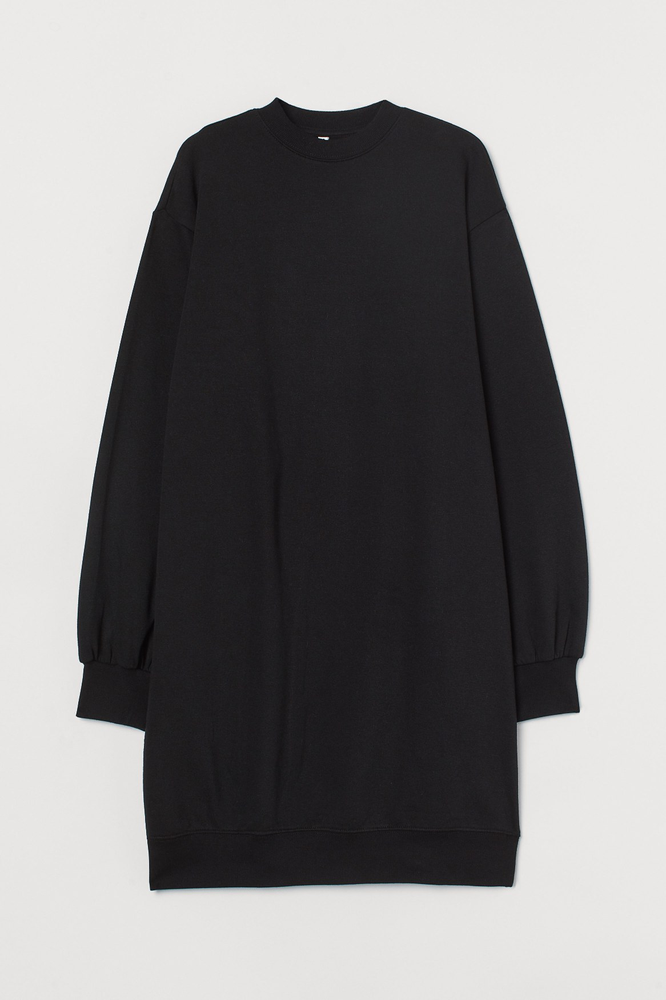

Product Title:  Elle Sweater Dress
Euclidean Distance from input image: 24.17226


In [22]:
def get_similar_products_cnn2(product_id, num_results):
    doc_id = Productids2.index(product_id)
    pairwise_dist = pairwise_distances(extracted_features, extracted_features[doc_id].reshape(1,-1))
    indices = np.argsort(pairwise_dist.flatten())[0:num_results]
    pdists  = np.sort(pairwise_dist.flatten())[0:num_results]
    print("="*20, "input product image", "="*20)
    ip_row = a_copy[['article_id','prod_name']].loc[a_copy['article_id']==int(Productids2[indices[0]])]
#     print(ip_row.head())
    for indx, row in ip_row.iterrows():
        display(Image(filename = "/Users/danielyang/Downloads/h-and-m-personalized-fashion-recommendations/images/" + str(product_id)[0:3]+'/'+str(product_id)+'.jpg', width = 224, height = 224,embed=True))
        print('Product Title: ', row['prod_name'])
    print("\n","="*20, "Recommended products", "="*20)
    for i in range(1,len(indices)):
        rows = a_copy[['article_id','prod_name']].loc[a_copy['article_id']==int(Productids2[indices[i]])]
#         print(rows)
        for indx, row in rows.iterrows():
            display(Image(filename = "/Users/danielyang/Downloads/h-and-m-personalized-fashion-recommendations/images/" + '0' + str(row['article_id'])[0:2] +'/'+ "0" +str(row['article_id'])+'.jpg', width = 224, height = 224,embed=True))
            print('Product Title: ', row['prod_name'])
            print('Euclidean Distance from input image:', pdists[i])

get_similar_products_cnn2('0863595006', 5)

# Image Feature extraction using Xception and local sensitivity hashing + cosine similarity

In [3]:
import os
import cv2
import numpy as np
import pandas as pd
from sklearn.utils import shuffle
from sklearn.preprocessing import LabelBinarizer
from keras.applications.xception import Xception,preprocess_input
import tensorflow as tf
from keras.preprocessing import image
from keras.layers import Input
from keras.backend import reshape
from sklearn.neighbors import NearestNeighbors
import matplotlib.pyplot as plt

In [4]:
images_dir = '/Users/danielyang/Downloads/h-and-m-personalized-fashion-recommendations/images'

In [11]:
def getImagePaths(path):
    """
    Function to Combine Directory Path with individual Image Paths
    
    parameters: path(string) - Path of directory
    returns: image_names(string) - Full Image Path
    """
    image_names = []
    for dirname, _, filenames in sorted(os.walk(path)):
        for filename in sorted(filenames):
            fullpath = os.path.join(dirname, filename)
            image_names.append(fullpath)
    return image_names

def preprocess_img(img_path):
    dsize = (225,225)
    new_image=cv2.imread(img_path)
    new_image=cv2.resize(new_image,dsize,interpolation=cv2.INTER_NEAREST)  
    new_image=np.expand_dims(new_image,axis=0)
    new_image=preprocess_input(new_image)
    return new_image

def load_data():
    output=[]
    output=getImagePaths(images_dir)[0:49999]
    return output

In [6]:
def model():
    model=Xception(weights='imagenet',include_top=False)
    for layer in model.layers:
        layer.trainable=False
        #model.summary()
    return model

def feature_extraction(image_data,model):
    features=model.predict(image_data)
    features=np.array(features)
    features=features.flatten()
    return features

In [7]:
def result_vector_cosine(model,feature_vector,new_img):
    new_feature = model.predict(new_img)
    new_feature = np.array(new_feature)
    new_feature = new_feature.flatten()
    N_result = 12
    nbrs = NearestNeighbors(n_neighbors = N_result, metric="cosine").fit(feature_vector)
    distances, indices = nbrs.kneighbors([new_feature])
    return(indices)

In [8]:
def input_show(data, index):
    title = "Query Image Title:"+ " " + articles[articles["article_id"] == int(index[-13:-4])]["prod_name"].item()
    plt.title(title)
    plt.imshow(data)
  
def show_result(data,result):
    fig = plt.figure(figsize=(14,10))
    for i in range(0,6):
        index_result=result[0][i]
        plt.subplot(2,3,i+1)
        plt.imshow(cv2.imread(data[index_result]))
#         print(index_result)
        title = "Product Title:"+ " " + articles[articles["article_id"] == int(output[index_result][-13:-4])]["prod_name"].item()
        plt.title(title)
    plt.show()

## Train and save model

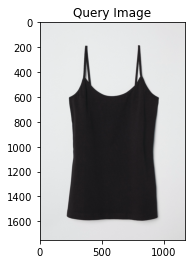

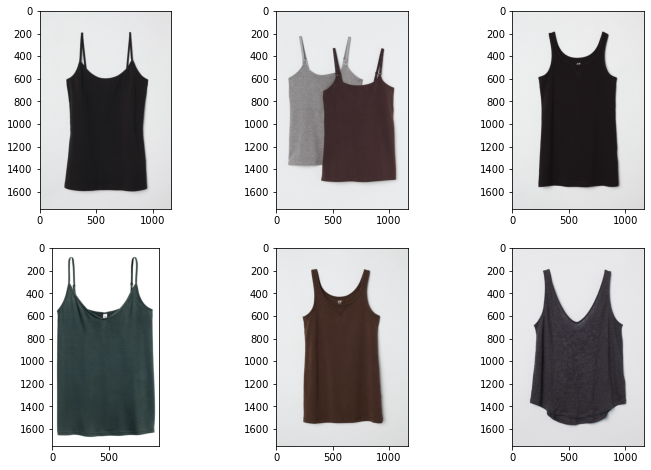

In [38]:
features=[]
output=load_data()
main_model=model()
# Limiting the data for training
for i in output[:9999]:
    new_img=preprocess_img(i)
    features.append(feature_extraction(new_img,main_model))
    
# save feature map
np.save(open('./xception_10k.npy', 'wb'), features)

feature_vec = np.array(features)
result=result_vector_cosine(main_model,feature_vec,preprocess_img(output[0]))
input_show(cv2.imread(output[0]),output[0])
show_result(output,result)

In [40]:
Productids1.index('0174057035')

92

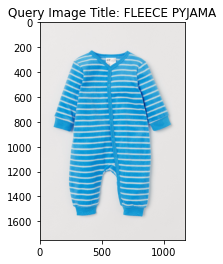

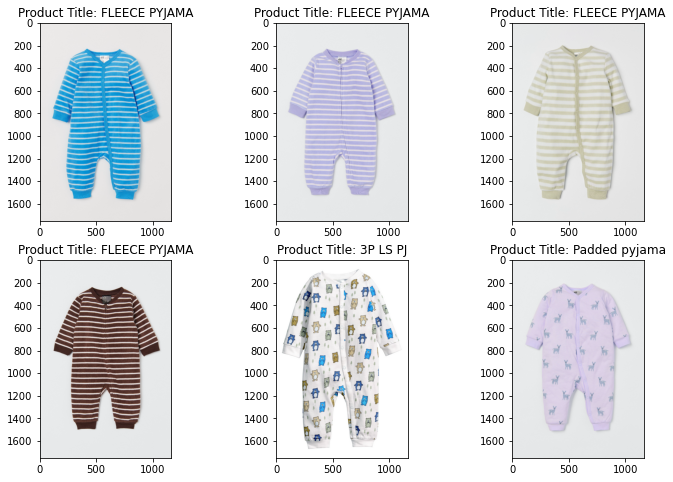

In [120]:
result=result_vector_cosine(main_model,feature_vec,preprocess_img(output[92]))
input_show(cv2.imread(output[92]), output[92])
show_result(output,result)

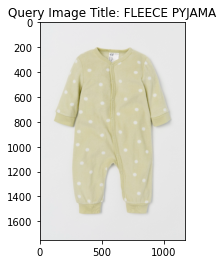

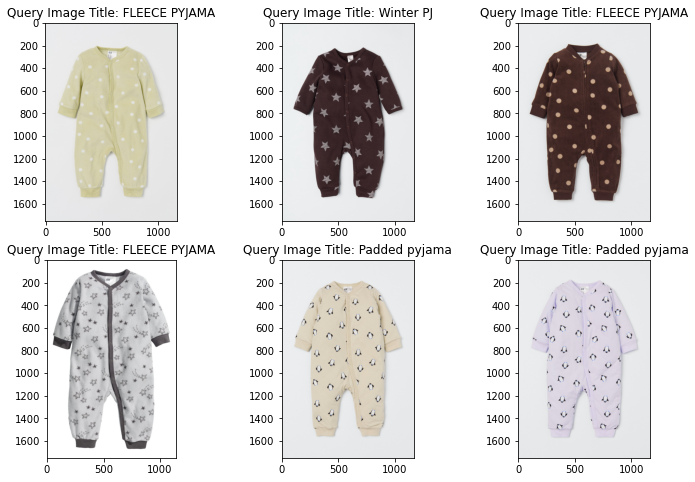

In [116]:
result=result_vector_cosine(main_model,feature_vec,preprocess_img(output[91]))
input_show(cv2.imread(output[91]),output[91])
show_result(output,result)

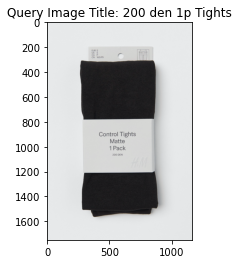

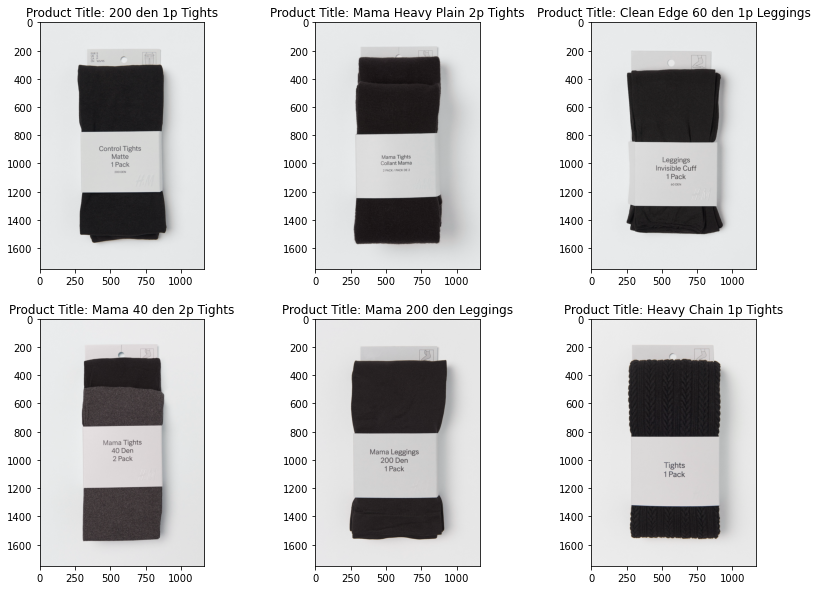

In [126]:
result=result_vector_cosine(main_model,feature_vec,preprocess_img(output[10]))
input_show(cv2.imread(output[10]),output[10])
show_result(output,result)

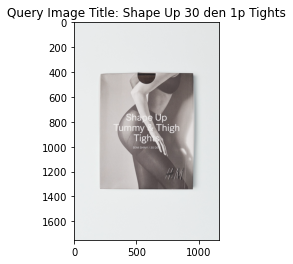

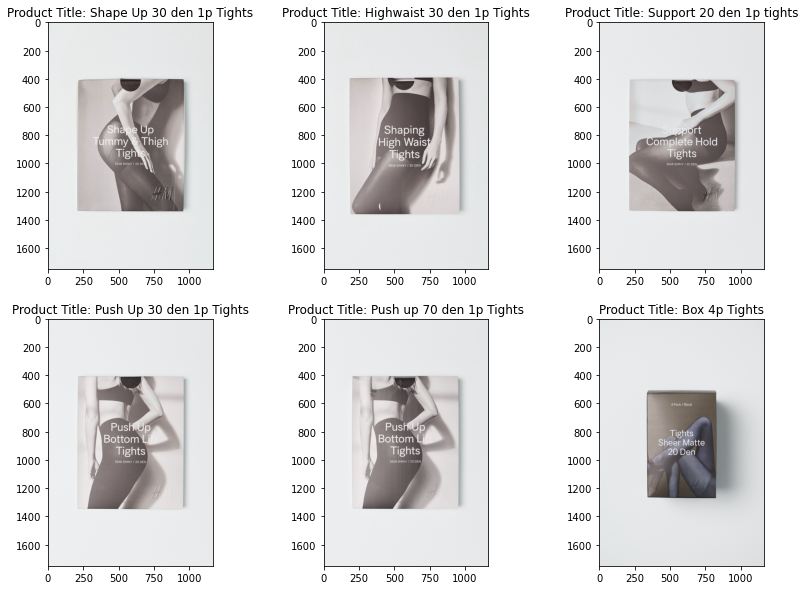

In [125]:
result=result_vector_cosine(main_model,feature_vec,preprocess_img(output[8]))
input_show(cv2.imread(output[8]),output[8])
show_result(output,result)

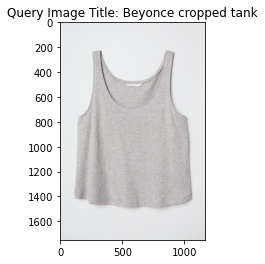

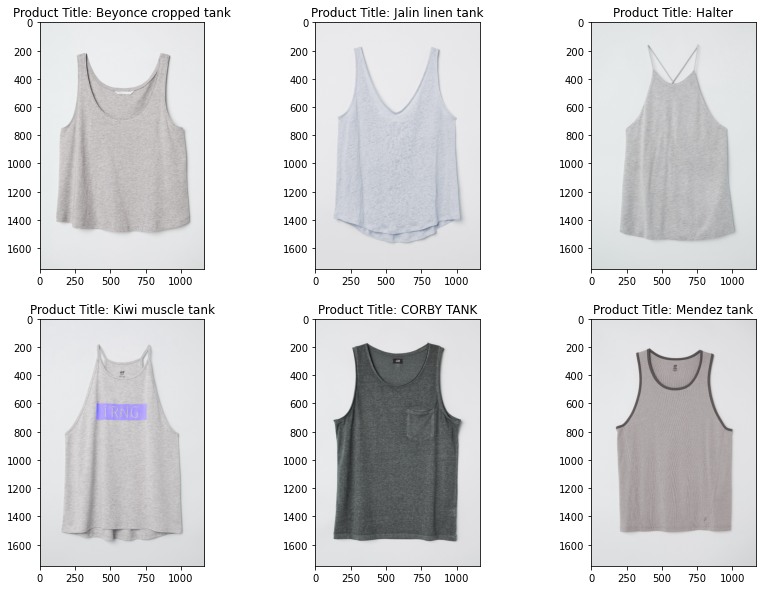

In [148]:
result=result_vector_cosine(main_model,feature_vec,preprocess_img(output[307]))
input_show(cv2.imread(output[307]),output[307])
show_result(output,result)

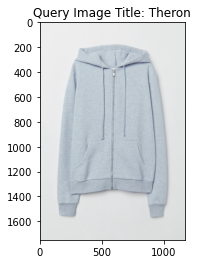

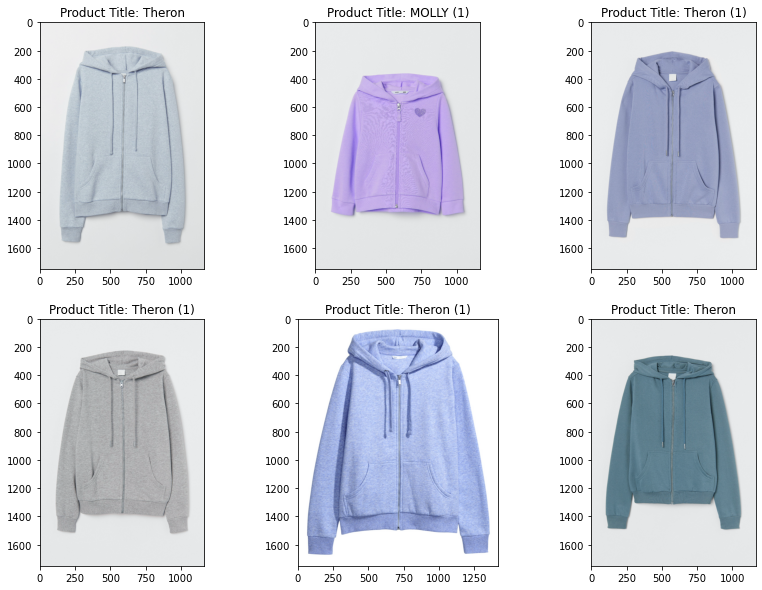

In [149]:
result=result_vector_cosine(main_model,feature_vec,preprocess_img(output[402]))
input_show(cv2.imread(output[402]),output[402])
show_result(output,result)

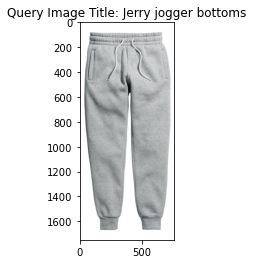

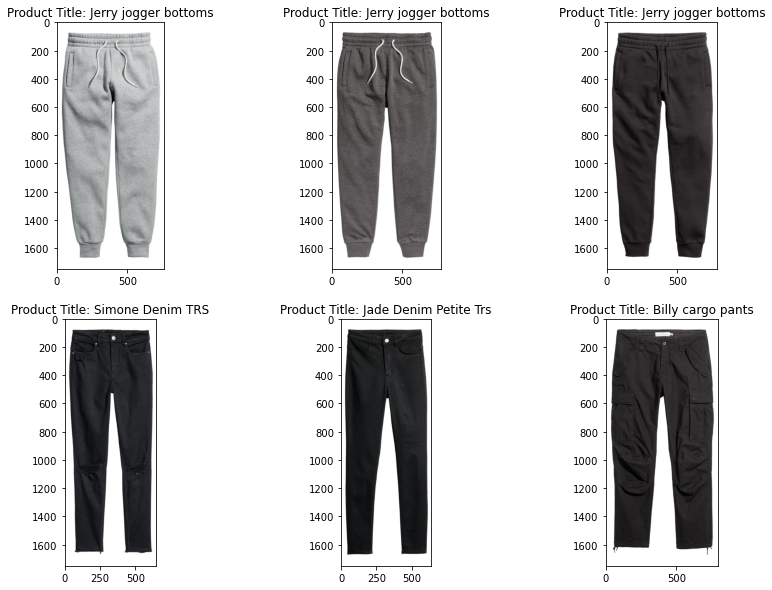

In [151]:
result=result_vector_cosine(main_model,feature_vec,preprocess_img(output[17]))
input_show(cv2.imread(output[17]),output[17])
show_result(output,result)

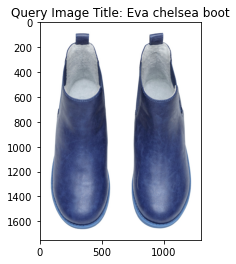

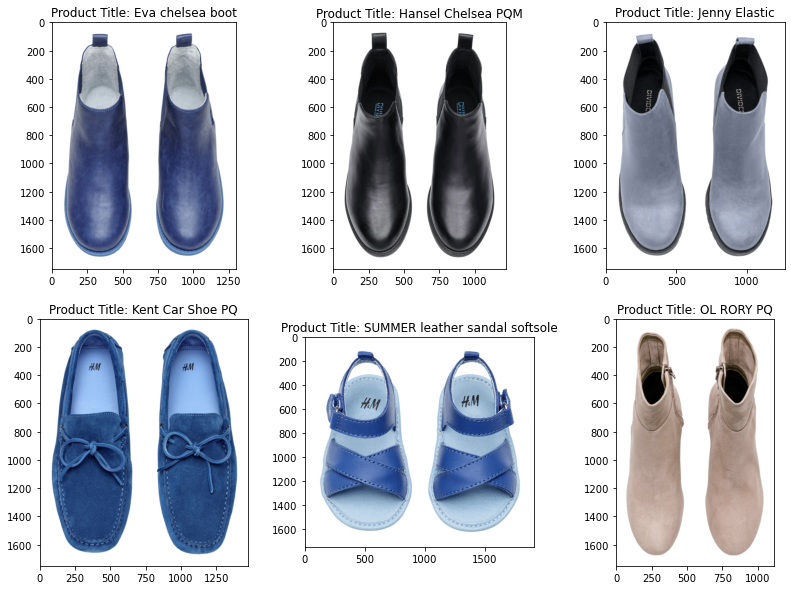

In [153]:
result=result_vector_cosine(main_model,feature_vec,preprocess_img(output[121]))
input_show(cv2.imread(output[121]),output[121])
show_result(output,result)

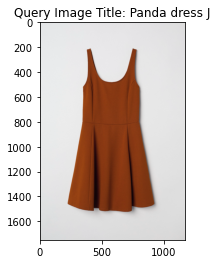

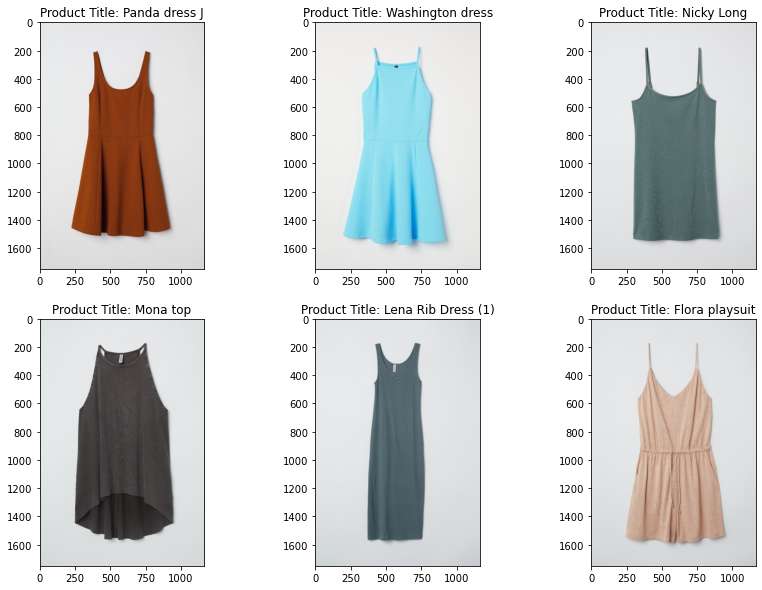

In [155]:
result=result_vector_cosine(main_model,feature_vec,preprocess_img(output[3794]))
input_show(cv2.imread(output[3794]),output[3794])
show_result(output,result)

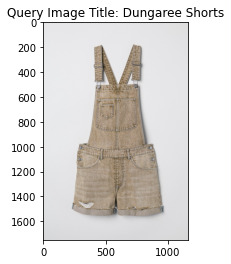

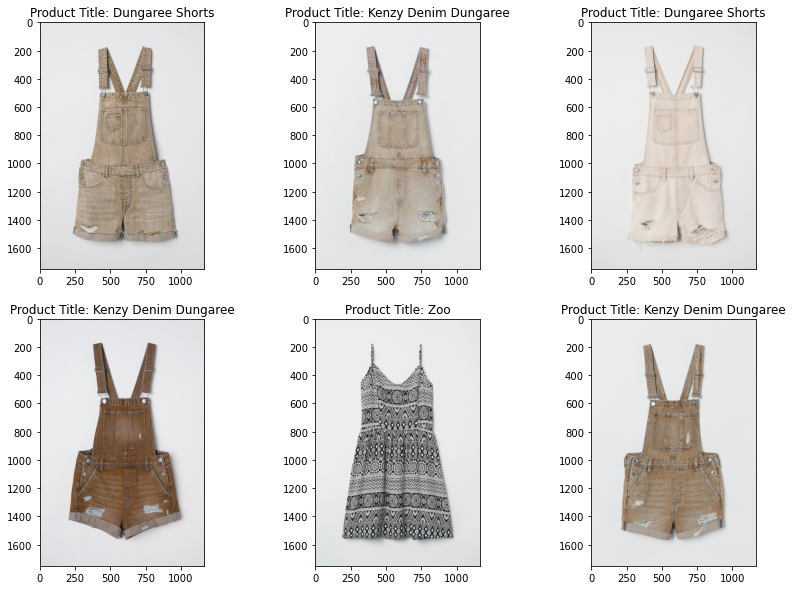

In [157]:
result=result_vector_cosine(main_model,feature_vec,preprocess_img(output[3164]))
input_show(cv2.imread(output[3164]),output[3164])
show_result(output,result)


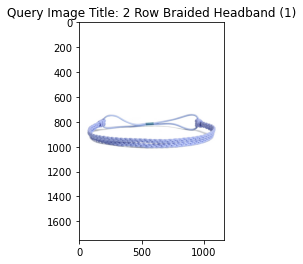

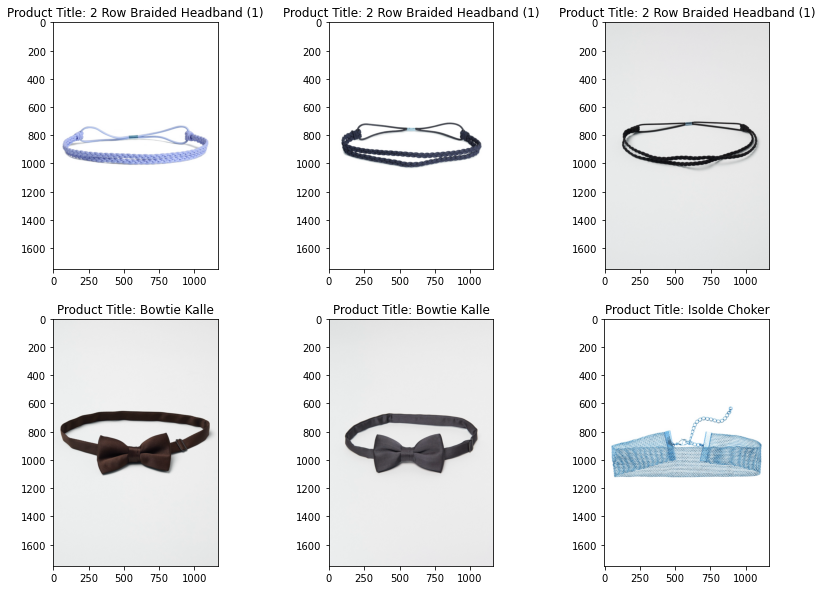

In [159]:
result=result_vector_cosine(main_model,feature_vec,preprocess_img(output[112]))
input_show(cv2.imread(output[112]),output[112])
show_result(output,result)

In [64]:
output[0][-13:-4]

'108775015'

In [82]:
print("A", articles[articles["article_id"] == int(output[0][-13:-4])]["prod_name"][0])

A Strap top


In [158]:
for i in range (0,10000):
    if(output[i][-13:-4]== str(176754019)):
        print(i)

112


# Training first 50k items

In [164]:
features=[]
output=load_data()
main_model=model()
# Limiting the data for training
for i in output[:49999]:
    new_img=preprocess_img(i)
    features.append(feature_extraction(new_img,main_model))
    
# save feature map
np.save(open('./xception_50k.npy', 'wb'), features)

In [9]:
features = np.load('./xception_50k.npy')

output=load_data()
main_model=model()

In [ ]:
feature_vec = np.array(features)
result=result_vector_cosine(main_model,feature_vec,preprocess_img(output[10]))
input_show(cv2.imread(output[10]),output[10])
show_result(output,result)

# Training 50-105k items

In [ ]:
features=[]
output=load_data()
main_model=model()
# Limiting the data for training
for i in output[50000:-1]:
    new_img=preprocess_img(i)
    features.append(feature_extraction(new_img,main_model))
    
# save feature map
np.save(open('./xception_55k.npy', 'wb'), features)